# **Assessing the Reduction of Bili-Bili Reservoir Water Body Area with K-Means Machine Learning Algorithm**<br>

Author: Iqbal F. Herlambang - 2025

Abstract: <br>
Remote sensing with satellite imagery, nowadays makes it easier for an analyst to see how the earth's appearance changes. Utilizing Landsat data, we can easily see changes in the area of the reservoir's water body. Bili-bili Dam, Sulawesi, Indonesia, has a high sedimentation issue because its upstream is Mount Bawakaraeng, which is quite active and often experiences slope slides during eruptions. It was found that using the K-Means Clustering algorithm (Unsupervised Machine Learning) there was a decrease in the area of the water body from 2016 of 11.77 km2 to 9.84 km2 in 2024 (- 16.39%). The K-Means algorithm automatically distinguishes between water and non-water areas, so changes can be monitored regularly and efficiently. With this data-driven information, dam management can be more evidence-based in formulating short- and long-term policies.<br>

*keywords* : Reservoir, K-Means, Landsat, Dam, Sedimentation


## Import Module

In [98]:
import ee
import geemap
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd

In [3]:
#!pip install xee
import xee

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 17.0 MB/s eta 0:00:00


# Data Preparation

In [4]:
ee.Authenticate()
ee.Initialize(project = 'satellite-rainfall-96961',opt_url ='https://earthengine-highvolume.googleapis.com')

In [5]:
# Import Basemap
map = geemap.Map(basemap = 'SATELLITE')
map

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

In [9]:
# Create Boundary
roi = map.draw_last_feature.geometry()
roi

ee.Geometry({
  "functionInvocationValue": {
    "functionName": "Feature.geometry",
    "arguments": {
      "feature": {
        "functionInvocationValue": {
          "functionName": "Feature",
          "arguments": {
            "geometry": {
              "functionInvocationValue": {
                "functionName": "GeometryConstructors.Polygon",
                "arguments": {
                  "coordinates": {
                    "constantValue": [
                      [
                        [
                          119.570045,
                          -5.288229
                        ],
                        [
                          119.570045,
                          -5.229084
                        ],
                        [
                          119.667206,
                          -5.229084
                        ],
                        [
                          119.667206,
                          -5.288229
                        ],
                        [
                          119.570045,
                          -5.288229
                        ]
                      ]
                    ]
                  },
                  "geodesic": {
                    "constantValue": false
                  }
                }
              }
            }
          }
        }
      }
    }
  }
})

In [18]:
# Import Dataset
landsat = ee.ImageCollection("LANDSAT/LC08/C02/T1_L2").filterBounds(roi).filterDate('2014','2025')
landsat

In [19]:
# Function of NDWI
def ndwi(img):
  qa = img.select('QA_PIXEL')
  cloud = qa.bitwiseAnd(1 << 3).neq(0)
  cirrus = qa.bitwiseAnd(1 << 2).neq(0)
  shadow = qa.bitwiseAnd(1 << 4).neq(0)
  mask = cloud.Or(cirrus).Or(shadow)
  bands = img.select('SR.*').multiply(2.75e-05).add(-0.2)
  index = bands.normalizedDifference(['SR_B3','SR_B5']).rename('ndwi')
  return index.updateMask(mask.Not()).copyProperties(img,img.propertyNames())

landsat_ndwi = landsat.map(ndwi)
landsat_ndwi

In [49]:
ds = xr.open_dataset(landsat_ndwi,engine='ee',crs = 'EPSG:4326',scale=0.00008983, geometry = roi)
ds

<xarray.Dataset> Size: 629MB
Dimensions:  (time: 221, lon: 1082, lat: 658)
Coordinates:
  * time     (time) datetime64[ns] 2kB 2014-01-08T02:11:56.669000 ... 2024-11...
  * lon      (lon) float64 9kB 119.6 119.6 119.6 119.6 ... 119.7 119.7 119.7
  * lat      (lat) float64 5kB -5.288 -5.288 -5.288 ... -5.229 -5.229 -5.229
Data variables:
    ndwi     (time, lon, lat) float32 629MB ...
Attributes: (12/26)
    date_range:             [1365638400000, 1654560000000]
    description:            <p>This dataset contains atmospherically correcte...
    keywords:               ['cfmask', 'cloud', 'fmask', 'global', 'l8sr', 'l...
    period:                 0
    product_tags:           ['global', 'sr', 'reflectance', 'l8sr', 'lst', 'c...
    provider:               USGS
    ...                     ...
    visualization_1_name:   Near Infrared (543)
    visualization_2_bands:  SR_B7,SR_B5,SR_B3
    visualization_2_max:    30000.0
    visualization_2_min:    0.0
    visualization_2_name:   Shortwave Infrared (753)
    crs:                    EPSG:4326

In [50]:
ds_2016 = ds.sel(time=slice('2016-01-01','2016-12-31'))
ds_2020 = ds.sel(time=slice('2020-01-01','2020-12-31'))
ds_2024 = ds.sel(time=slice('2024-01-01','2024-12-31'))

In [51]:
ds_2016 = ds_2016.mean(dim = 'time')
ds_2020 = ds_2020.mean(dim = 'time')
ds_2024 = ds_2024.mean(dim = 'time')

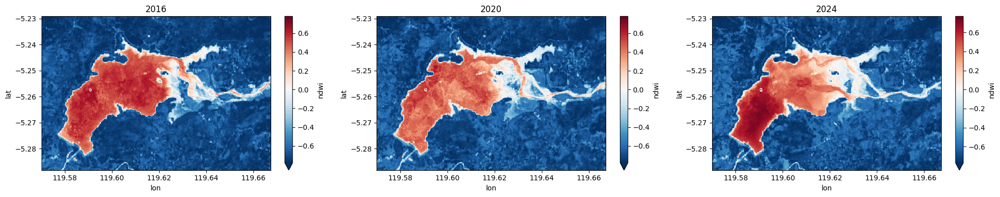

In [54]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 4))

axes = axes.flatten()

datasets = [ds_2016, ds_2020, ds_2024]
years = [2016,2020,2024]

for i, (ds, year) in enumerate(zip(datasets, years)):
    ds.ndwi.plot(x='lon', y='lat', ax=axes[i], robust=True)
    axes[i].set_title(str(year))

plt.tight_layout()
plt.show()

# K-Means Clustering

In [44]:
from sklearn.cluster import KMeans

In [78]:
model = KMeans(n_clusters=3,random_state=42)

df_2016 = ds_2016.to_dataframe()
df_2020 = ds_2020.to_dataframe()
df_2024 = ds_2024.to_dataframe()
df_2024 # Example

ndwi
lon        lat                
119.570090 -5.288184 -0.645690
           -5.288094 -0.733606
           -5.288004 -0.733606
           -5.287915 -0.733606
           -5.287825 -0.699167
...                        ...
119.667196 -5.229525 -0.621735
           -5.229435 -0.620882
           -5.229345 -0.620882
           -5.229256 -0.620882
           -5.229166 -0.667806

[711956 rows x 1 columns]

In [79]:
df_2016['clustering'] = model.fit_predict(df_2016[['ndwi']])
df_2020['clustering'] = model.fit_predict(df_2020[['ndwi']])
df_2024['clustering'] = model.fit_predict(df_2024[['ndwi']])
df_2024 # Example

ndwi  clustering
lon        lat                            
119.570090 -5.288184 -0.645690           0
           -5.288094 -0.733606           0
           -5.288004 -0.733606           0
           -5.287915 -0.733606           0
           -5.287825 -0.699167           0
...                        ...         ...
119.667196 -5.229525 -0.621735           0
           -5.229435 -0.620882           0
           -5.229345 -0.620882           0
           -5.229256 -0.620882           0
           -5.229166 -0.667806           0

[711956 rows x 2 columns]

In [80]:
xarr_2016 = df_2016.to_xarray().sortby('lon').sortby('lat')
xarr_2020 = df_2020.to_xarray().sortby('lon').sortby('lat')
xarr_2024 = df_2024.to_xarray().sortby('lon').sortby('lat')
xarr_2024

<xarray.Dataset> Size: 6MB
Dimensions:     (lon: 1082, lat: 658)
Coordinates:
  * lon         (lon) float64 9kB 119.6 119.6 119.6 119.6 ... 119.7 119.7 119.7
  * lat         (lat) float64 5kB -5.288 -5.288 -5.288 ... -5.229 -5.229 -5.229
Data variables:
    ndwi        (lon, lat) float32 3MB -0.6457 -0.7336 ... -0.6209 -0.6678
    clustering  (lon, lat) int32 3MB 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0

# Result

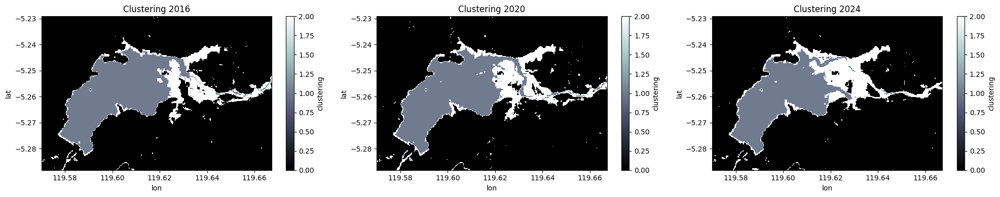

In [94]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 4))
axes = axes.flatten()

datasets = [xarr_2016, xarr_2020, xarr_2024]
years = [2016, 2020, 2024]
titles = ['Clustering 2016', 'Clustering 2020', 'Clustering 2024']


for i, (ds, year, title) in enumerate(zip(datasets, years, titles)):
    ds.clustering.plot(x='lon', y='lat', ax=axes[i], cmap='bone')
    axes[i].set_title(title)

plt.tight_layout()
plt.show()

In [96]:
bili_pixels_2016 = (xarr_2016.clustering == 1).sum(dim = ['lon','lat'])
bili_pixels_2020 = (xarr_2020.clustering == 1).sum(dim = ['lon','lat'])
bili_pixels_2024 = (xarr_2024.clustering == 1).sum(dim = ['lon','lat'])

bili_area_2016 = (bili_pixels_2016 * 10 * 10)/ 1e6 # km
bili_area_2020 = (bili_pixels_2020 * 10 * 10)/ 1e6 # km
bili_area_2024 = (bili_pixels_2024 * 10 * 10)/ 1e6 # km

In [104]:
data = {'Year': [2016, 2020, 2024],
        'Main Water Body Area (km²)': [bili_area_2016.values.item(), bili_area_2020.values.item(), bili_area_2024.values.item()]}
result = pd.DataFrame(data).round(2)
result

,Year,Main Water Body Area (km²)
0,2016,11.77
1,2020,11.13
2,2024,9.84


<a href="https://www.linkedin.com/in/iqbalfauzanh/"><img src="https://img.shields.io/badge/-© 2025 Iqbal Fauzan Herlambang-417DAC?style=for-the-badge&logoColor=white"/></a>